In [1]:
import json
import plotly.graph_objects as go

In [2]:
with open("./results/evaloff_filtered_results.json") as f:
    results = json.load(f)
    
results_list = list(results.values())
results_list.sort(key=lambda r: r['method_name'])

In [3]:
def show_box_plot(results, results_list, prefix, metric_name, title):
    box = go.Figure()
    prefix_len = len(prefix)
    
    for result in filter(lambda r: prefix in r['method_name'], results_list):
        box.add_trace(go.Box(y=result[metric_name], name=result['method_name'][prefix_len:]))

    box.update_layout(title_text=title)
    box.show()

In [4]:
for result in results_list:
    print(result['method_name'][15:])

base_bm25_concat
base_bm25_sum
base_doc2veccosine_concat
base_doc2veccosine_sum
base_node2veccosine_directed
base_node2veccosine_undirected
base_personalizedpagerank_directed
base_personalizedpagerank_undirected
base_random
base_svd
custom_tfidfcosine_jaccard
stateofart_method11_classic
stateofart_method11_expert
stateofart_method11_serendipity
stateofart_method20
stateofart_method21simplified
stateofart_method39
stateofart_method7_kea_glo
stateofart_method7_kea_loc
stateofart_method7_kpminer_glo
stateofart_method7_kpminer_loc


In [5]:
for metrics in results_list[0].keys():
    print(metrics)

method_name
coverage_item_global
coverage_user_global
diversity_global
accuracy_content_tfidf
accuracy_graph_jaccard
novelty_average_pub_year
novelty_inverse_popularity
diversity_graph_jaccard
diversity_content_tfidf


# Accuracy

### Content

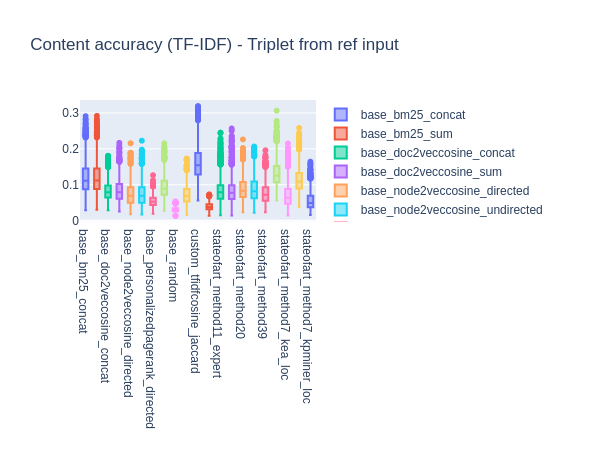

In [6]:
show_box_plot(results, results_list, 'tripletfromref_', 'accuracy_content_tfidf', 'Content accuracy (TF-IDF) - Triplet from ref input')

### Graph

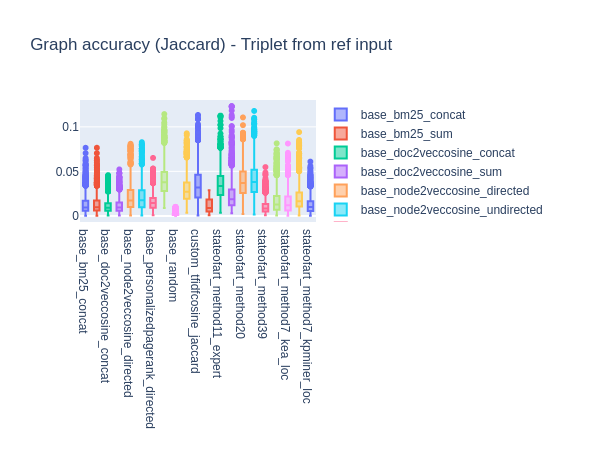

In [7]:
show_box_plot(results, results_list, 'tripletfromref_', 'accuracy_graph_jaccard', 'Graph accuracy (Jaccard) - Triplet from ref input')

# Coverage

### Items - Global

In [8]:
global_item_coverage = [(result['method_name'], result['coverage_item_global']) for result in results_list]
global_item_coverage.sort(key=lambda e: e[1], reverse=True)

for score in filter(lambda n: 'tripletfrom' in n[0], global_item_coverage):
    print('Method :', score[0][15:],':',score[1])

Method : base_random : 1.0
Method : base_doc2veccosine_concat : 0.9988936613302095
Method : base_doc2veccosine_sum : 0.9712351945854484
Method : custom_tfidfcosine_jaccard : 0.9515163347650657
Method : stateofart_method39 : 0.9469608225953403
Method : stateofart_method11_serendipity : 0.9381101132370168
Method : base_personalizedpagerank_undirected : 0.9370688533125081
Method : stateofart_method7_kea_glo : 0.8554601067291423
Method : stateofart_method7_kpminer_glo : 0.8406872315501757
Method : stateofart_method21simplified : 0.8022256930886372
Method : base_bm25_sum : 0.6866458414681765
Method : stateofart_method11_expert : 0.6836522191852141
Method : base_bm25_concat : 0.6834569829493687
Method : base_node2veccosine_directed : 0.634778081478589
Method : base_node2veccosine_undirected : 0.6328907978654171
Method : stateofart_method20 : 0.40316282702069506
Method : base_personalizedpagerank_directed : 0.38064558115319536
Method : stateofart_method7_kea_loc : 0.3619679812573214
Method : 

### Users - Global

In [9]:
global_user_coverage = [(result['method_name'], result['coverage_user_global']) for result in results_list]
global_user_coverage.sort(key=lambda e: e[1]['n_complete'], reverse=True)

for score in filter(lambda n: 'tripletfrom' in n[0], global_user_coverage):
    print('Method :', score[0][15:],':',score[1]['n_complete'],'/',score[1]['n_incomplete'],'/',score[1]['n_empty'])

Method : base_bm25_concat : 3000 / 0 / 0
Method : base_bm25_sum : 3000 / 0 / 0
Method : base_doc2veccosine_concat : 3000 / 0 / 0
Method : base_doc2veccosine_sum : 3000 / 0 / 0
Method : base_node2veccosine_directed : 3000 / 0 / 0
Method : base_node2veccosine_undirected : 3000 / 0 / 0
Method : base_personalizedpagerank_directed : 3000 / 0 / 0
Method : base_personalizedpagerank_undirected : 3000 / 0 / 0
Method : base_random : 3000 / 0 / 0
Method : base_svd : 3000 / 0 / 0
Method : custom_tfidfcosine_jaccard : 3000 / 0 / 0
Method : stateofart_method11_classic : 3000 / 0 / 0
Method : stateofart_method39 : 3000 / 0 / 0
Method : stateofart_method7_kpminer_loc : 3000 / 0 / 0
Method : stateofart_method7_kea_loc : 2998 / 1 / 1
Method : stateofart_method21simplified : 2956 / 44 / 0
Method : stateofart_method7_kpminer_glo : 2922 / 78 / 0
Method : stateofart_method11_serendipity : 2522 / 478 / 0
Method : stateofart_method11_expert : 2495 / 505 / 0
Method : stateofart_method20 : 2004 / 938 / 58
Metho

# Diversity

### Global - Shannon

In [10]:
global_item_coverage = [(result['method_name'], result['diversity_global']) for result in results_list]
global_item_coverage.sort(key=lambda e: e[1], reverse=True)

for score in filter(lambda n: 'tripletfrom' in n[0], global_item_coverage):
    print('Method :', score[0][15:],':',score[1])

Method : base_random : 13.870460730018067
Method : base_doc2veccosine_concat : 13.575904050741734
Method : stateofart_method11_serendipity : 13.309080199313971
Method : custom_tfidfcosine_jaccard : 13.050179038644309
Method : stateofart_method7_kea_glo : 12.939544547069668
Method : base_doc2veccosine_sum : 12.91310761280886
Method : base_node2veccosine_directed : 12.691473673775231
Method : base_node2veccosine_undirected : 12.690363370603713
Method : stateofart_method39 : 12.531940775651854
Method : stateofart_method7_kpminer_glo : 12.389405240923033
Method : base_personalizedpagerank_undirected : 12.384436828552882
Method : stateofart_method20 : 11.687519366356971
Method : stateofart_method21simplified : 11.643326293819777
Method : base_bm25_sum : 11.617878172712803
Method : base_bm25_concat : 11.60119995927953
Method : stateofart_method11_expert : 11.53513481423571
Method : base_svd : 10.962564452138063
Method : stateofart_method7_kea_loc : 10.737246156433594
Method : base_personaliz

### Local - Content

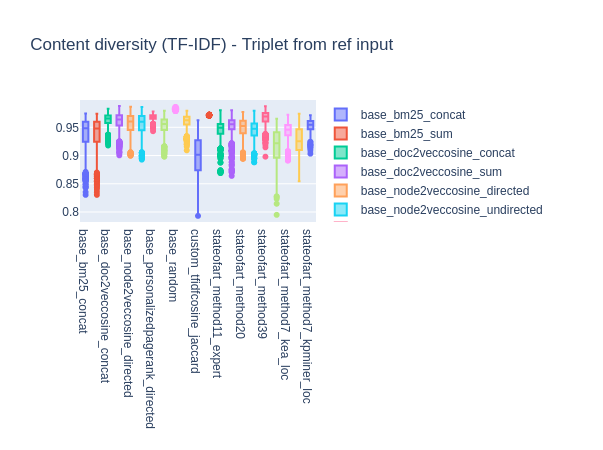

In [11]:
show_box_plot(results, results_list, 'tripletfromref_', 'diversity_content_tfidf', 'Content diversity (TF-IDF) - Triplet from ref input')

### Local - Graph

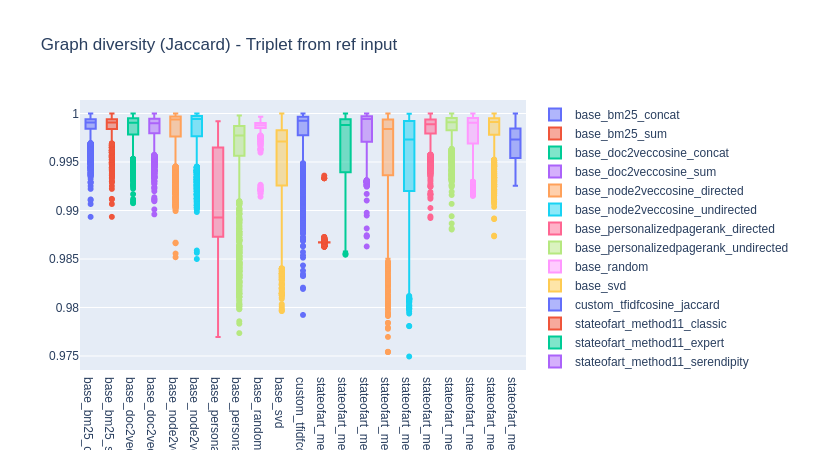

In [12]:
show_box_plot(results, results_list, 'tripletfromref_', 'diversity_graph_jaccard', 'Graph diversity (Jaccard) - Triplet from ref input')

# Novelty

### Publication year

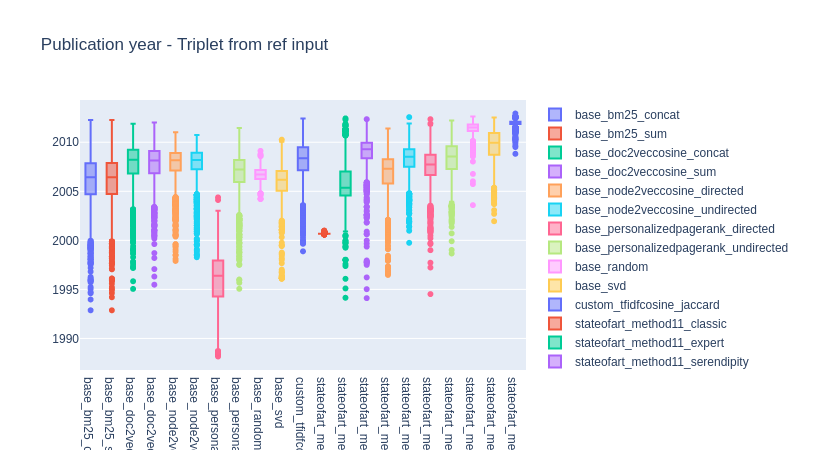

In [13]:
show_box_plot(results, results_list, 'tripletfromref_', 'novelty_average_pub_year', 'Publication year - Triplet from ref input')

### Citation

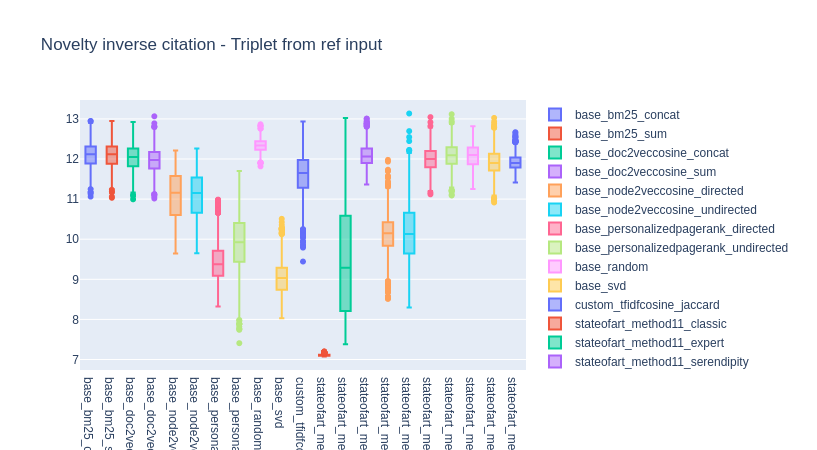

In [14]:
show_box_plot(results, results_list, 'tripletfromref_', 'novelty_inverse_popularity', 'Novelty inverse citation - Triplet from ref input')